In [111]:
import random
import subprocess
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [112]:
probabalities = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]
graph_types = ["er", "ba"]

In [113]:
er_graphs = []
ba_graphs = []


In [114]:
def compute_results(prob, nodes, graph_type):
  file = open("output.txt", "r")
  for lines in file:
    results = lines.split(" ")
    mean = float(results[0])
    max_distance = float(results[1].removesuffix("\n"))

    if (graph_type == graph_types[0]):
      er_graphs.append({prob: [nodes, mean, max_distance]})
    else:
      ba_graphs.append({prob: [nodes, mean, max_distance]})


In [115]:
for prob in probabalities:
    for i in range(10):
        nodes = random.randint(50, 100)
        for graph_type in graph_types:
            subprocess.run(["./main", f"{prob}", f"{nodes}", f"{graph_type}"])
            compute_results(prob, nodes, graph_type)

Probabilidade: 0.05
Quantidade de nós: 64
Tipo de Grafo: er

0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 
0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 
0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 
0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 

In [116]:
def list_to_dataframe(list, index):
    data = []
    for item in list:
        for key, values in item.items():
            data.append([key, values[index]])
    return pd.DataFrame(data, columns=['Key', 'Value'])

In [117]:
means_er_df = list_to_dataframe(er_graphs, 1)
means_ba_df = list_to_dataframe(ba_graphs, 1)

mean_of_means_er = means_er_df.groupby('Key')['Value'].mean()
mean_of_means_ba = means_ba_df.groupby('Key')['Value'].mean()

In [118]:
def plot(fisrt_data_dict, second_data_dict, first_label, second_label, x_label, y_label, title):
    means_er = [fisrt_data_dict.get(key, 0) for key in probabalities]
    means_ba = [second_data_dict.get(key, 0) for key in probabalities]

    width = 0.3
    x = np.arange(len(probabalities))

    plt.bar(x - width/2, means_er, width, label=f"{first_label}")
    plt.bar(x + width/2, means_ba, width, label=f"{second_label}")

    plt.xlabel(f"{x_label}")
    plt.ylabel(f"{y_label}")
    plt.title(f"{title}")
    plt.xticks(x, probabalities)
    plt.legend()

    plt.show()

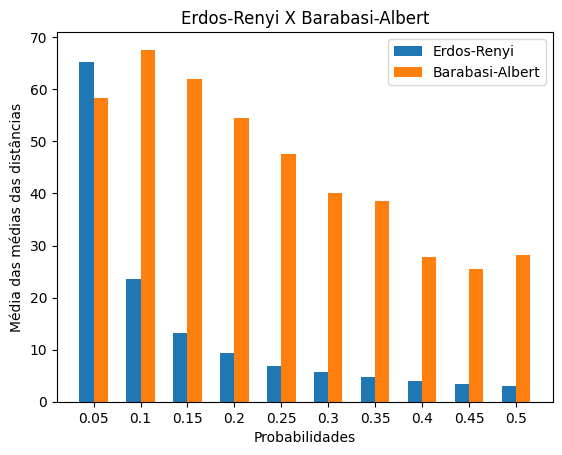

In [119]:
plot(mean_of_means_er, mean_of_means_ba, 'Erdos-Renyi', 'Barabasi-Albert', 'Probabilidades', 'Média das médias das distâncias', 'Erdos-Renyi X Barabasi-Albert')

Observa-se que no modelo Erdos-Renyi a média das distâncias ela cai consideravelmente com o aumento da probabilidade. Isso se deve ao fato de que, por ser um algoritmo totalmente aleatório, os nós serão mais esparsos (pensando o grafo como uma matriz de adjacência), fazendo com que a média geral das distâncias vá caindo. Já no modelo de Barabasi-Albert, percebe-se um declínio menor na média das distâncias se comparado ao modelo de Erdos-Renyi. Isso se deve pelo fato do modelo "criar" conglomerados de nós, fazendo com que a média geral das distâncias caia lentamente. Portanto, é notável que os valores das médias das distâncias médias no modelo de Barabasi-Albert são consideravelmente maiores do que os mesmos valores no modelo de Erdos-Renyi, com exceção de quando a probabilidade é igual à 0.05, já que a baixa probabilidade faz com que existam poucos e pequenos conglomerados no algoritmo de Barabasi-Albert.

In [120]:
means_er_df = list_to_dataframe(er_graphs, 1)
means_ba_df = list_to_dataframe(ba_graphs, 1)

stddev_of_means_er = means_er_df.groupby('Key')['Value'].std()
stddev_of_means_ba = means_ba_df.groupby('Key')['Value'].std()

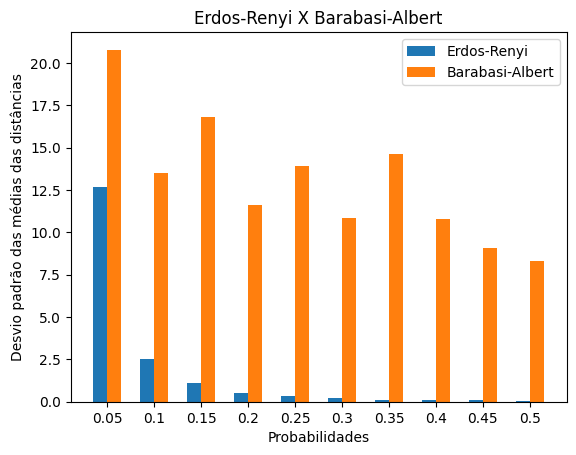

In [121]:
plot(stddev_of_means_er, stddev_of_means_ba, 'Erdos-Renyi', 'Barabasi-Albert', 'Probabilidades', 'Desvio padrão das médias das distâncias', 'Erdos-Renyi X Barabasi-Albert')

Observa-se que o desvio padrão no modelo de Erdos-Renyi é mais baixo devido à aleatoriedade, pois ela permite que ocorra uma distribuição mais esparsa dos nós, fazendo com que o desvio padrão seja baixo. Já no caso de Barabasi-Albert, a criação de conglomerados de nós faz com que o desvio padrão seja mais alto, pois as distâncias entre nós de um mesmo conglomerado são baixas, enquanto as distâncias entre nós de diferentes conglomerados são mais altas, resultando em um desvio padrão alto.

In [122]:
max_distance_er_df = list_to_dataframe(er_graphs, 2)
max_distance_ba_df = list_to_dataframe(ba_graphs, 2)

mean_of_max_distances_er = max_distance_er_df.groupby('Key')['Value'].mean()
mean_of_max_distances_ba = max_distance_ba_df.groupby('Key')['Value'].mean()

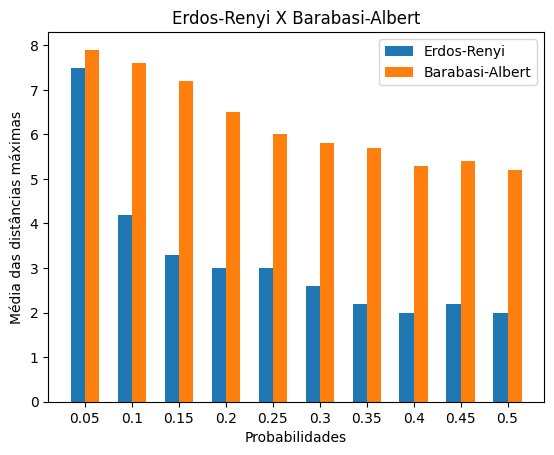

In [123]:
plot(mean_of_max_distances_er, mean_of_max_distances_ba, 'Erdos-Renyi', 'Barabasi-Albert', 'Probabilidades', 'Média das distâncias máximas', 'Erdos-Renyi X Barabasi-Albert')

Observa-se que, tanto no modelo Erdos-Renyi, quanto no modelo Barabasi-Albert, a média das distâncias máximas diminui à medida que a probabilidade aumenta, pois com mais nós há mais caminhos possíveis entre um par de nós. Entretanto, é possível notar que os valores das médias das distâncias máximas são consideravelmente maiores no modelo de Barabasi-Albert se comparados ao modelo de Erdos-Renyi. Isso se deve ao fato de que, por mais que hajam mais arestas no modelo de Barabasi-Albert, elas estão mais concentradas nos conglomerados, fazendo com que a distância entre os eles se mantenha alta, elevando a média geral.

In [124]:
max_distance_er_df = list_to_dataframe(er_graphs, 2)
max_distance_ba_df = list_to_dataframe(ba_graphs, 2)

stddev_of_max_distances_er = max_distance_er_df.groupby('Key')['Value'].std()
stddev_of_max_distances_ba = max_distance_ba_df.groupby('Key')['Value'].std()

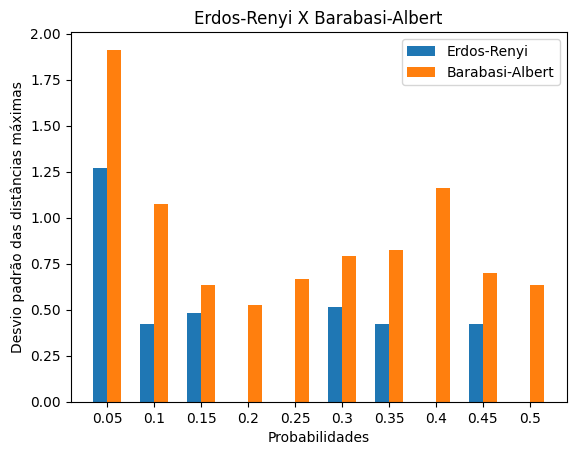

In [125]:
plot(stddev_of_max_distances_er, stddev_of_max_distances_ba, 'Erdos-Renyi', 'Barabasi-Albert', 'Probabilidades', 'Desvio padrão das distâncias máximas', 'Erdos-Renyi X Barabasi-Albert')

Observa-se que em alguns casos o modelo de Erdos-Renyi apresenta desvio padrão igual à 0, o que indica que as distâncias máximas foram iguais em todas as execuções do modelo para uma determinidada probabilidade. Isso deve ao fato da esparsidade dos grafos de Erdos-Renyi. Já no modelo de Barabasi-Albert, nota-se que sempre há desviio padrão das distâncias máximas, indicando uma maior variabilidade nas execuções do algoritmo em uma mesma probabilidade. É interessante notar que em ambos os modelos, o comportamento do desvio padrão não é muito previsível, variando bastante entre execuções de diferentes probabilidades.